#🦌 Using Transfer Learning and TensorFlow 2.3 to Classify Oregon Wildlife 🦅

In this project we are going to be using machine learning to help us identify different animal species living in Oregon.

To do this, we will be using data from the [Oregon Wildlife Dataset](https://www.kaggle.com/virtualdvid/oregon-wildlife). It consists of a collection of 14,000+ labelled images distributed in 20 classes as follows:
* bald eagle images: 748
* black bear images: 718
* cougar images: 680 
* elk images: 660 
* gray wolf images: 730 
* mountain beaver images: 577 
* bobcat images: 696 
* nutria images: 701 
* coyote images: 736 
* columbian black-tailed deer images: 735 
* seals images: 698
* canada lynx images: 717 
* ringtail images: 588 
* red fox images: 759
* gray fox images: 668
* virginia opossum images: 728 
* sea lions images: 726
* raccoon images: 728
* raven images: 656 
* deer images: 764

This kind of problem is called **multi-class image classification**. It is multi-class because we are trying to classify mutliple different species of animals.

For preprocessing our data, we are going to use **TensorFlow 2.3** The whole premise here is to get our data into Tensors (arrays of numbers which can be run on GPUs) and then allow a machine learning model to find patterns between them.

For our machine learning model, we are going to be using a **pretrained deep learning model** from **TensorFlow Hub**.

The process of using a pretrained model and adapting it to your own problem is called **transfer learning**. We do this because rather than train our own model from scratch (could be timely and expensive), we leverage the patterns of another model which has been trained to classify images.

##Getting our workspace ready

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

TF version: 2.3.0
Hub version: 0.9.0


In [ ]:
# Check for GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


##Getting data ready

#### Fetching our Kaggle dataset into Google Colab
Let us see [how to download our Kaggle dataset into Colab](https://medium.com/analytics-vidhya/how-to-fetch-kaggle-datasets-into-google-colab-ea682569851a).

Mount the drive to our Colab notebook.

In [ ]:
# Running this cell will provide you with a token to link your drive to this notebook
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [1]:
# Provide the config path to kaggle.json
import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/My Drive/projects/wildlife'

In [ ]:
# Change our present working directory
%cd /content/drive/My Drive/projects/wildlife

/content/drive/My Drive/projects/wildlife


In [ ]:
# Kaggle API Command to download the dataset
!kaggle datasets download -d virtualdvid/oregon-wildlife

100% 4.54G/4.55G [01:37<00:00, 41.9MB/s]
100% 4.55G/4.55G [01:37<00:00, 50.2MB/s]


In [ ]:
# Checking the content in our directory using ls command
%ls

kaggle.json  oregon-wildlife.zip  wildlife_classification.ipynb  wildlife.h5


In [ ]:
# Unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

Streaming output truncated to the last 5000 lines.
  inflating: oregon_wildlife/oregon_wildlife/nutria/dc8979d2faf345b2d5.jpg  
  inflating: oregon_wildlife/oregon_wildlife/nutria/dca571b2d2006b462f.jpg  
  inflating: oregon_wildlife/oregon_wildlife/nutria/dd0f64790789904451.jpeg  
  inflating: oregon_wildlife/oregon_wildlife/nutria/de0554167716bbd246.jpg  
  inflating: oregon_wildlife/oregon_wildlife/nutria/de1422a88cf33075c7.jpg  
  inflating: oregon_wildlife/oregon_wildlife/nutria/de15ced87a2f98ebdc.jpg  
  inflating: oregon_wildlife/oregon_wildlife/nutria/de27e7a3e2247e2c97.jpg  
  inflating: oregon_wildlife/oregon_wildlife/nutria/df045e9514e7e77ee4.JPG  
  inflating: oregon_wildlife/oregon_wildlife/nutria/df3d4afbde1e4096ab.jpg  
  inflating: oregon_wildlife/oregon_wildlife/nutria/dfe010f959fbbf6a97.jpeg  
  inflating: oregon_wildlife/oregon_wildlife/nutria/dffcec7d34c26f24cb.jpg  
  inflating: oregon_wildlife/oregon_wildlife/nutria/dffd8ba6bc1085d036.jpg  
  inflating: oregon_wil

In [ ]:
%ls

kaggle.json       oregon-wildlife.zip            wildlife.h5
oregon_wildlife/  wildlife_classification.ipynb


In [ ]:
%ls oregon_wildlife/oregon_wildlife/

bald_eagle/                   cougar/    gray_wolf/        red_fox/
black_bear/                   coyote/    mountain_beaver/  ringtail/
bobcat/                       deer/      nutria/           sea_lions/
canada_lynx/                  elk/       raccoon/          seals/
columbian_black-tailed_deer/  gray_fox/  raven/            virginia_opossum/


### Accessing the data

In [ ]:
import pathlib

data_dir = pathlib.Path('/content/drive/My Drive/projects/wildlife/oregon_wildlife/oregon_wildlife')

There are 14013 total images:

In [ ]:
img_count = len(list(data_dir.glob('*/*')))
print(img_count)

14013


The Oregon Wildlife dataset contains 20 sub-directories, one per class:

In [ ]:
for item in data_dir.glob("*"):
  print(item.name)

bald_eagle
black_bear
bobcat
canada_lynx
columbian_black-tailed_deer
cougar
coyote
deer
elk
gray_fox
gray_wolf
mountain_beaver
nutria
raccoon
raven
red_fox
ringtail
sea_lions
seals
virginia_opossum


Each directory contains images of that type of animal. Here is a raccoon 🦝

In [ ]:
import PIL
import PIL.Image

raccoon = list(data_dir.glob("raccoon/*.jpg"))
PIL.Image.open(str(raccoon[0]))

Output hidden; open in https://colab.research.google.com to view.

The tree structure of the files can be used to compile a `class_names` list.

In [ ]:
import numpy as np

class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_names)

['bald_eagle' 'black_bear' 'bobcat' 'canada_lynx'
 'columbian_black-tailed_deer' 'cougar' 'coyote' 'deer' 'elk' 'gray_fox'
 'gray_wolf' 'mountain_beaver' 'nutria' 'raccoon' 'raven' 'red_fox'
 'ringtail' 'sea_lions' 'seals' 'virginia_opossum']


How many images are there of each species?

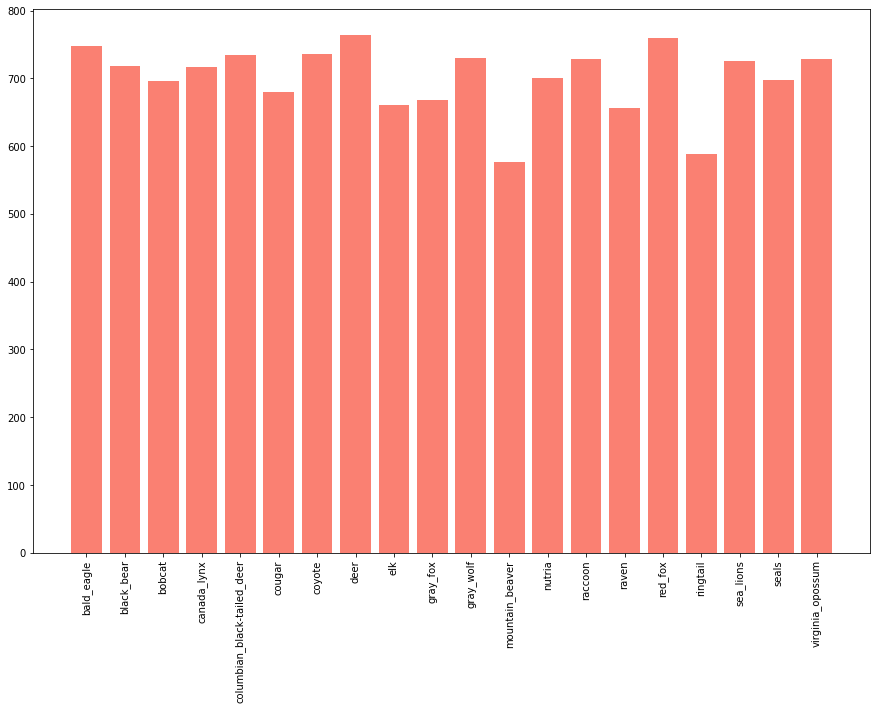

In [ ]:
Dict={}
for myclass in class_names:
  myclass_path = str(myclass)+'/*'
  Dict[str(myclass)] = len(list(data_dir.glob(myclass_path)))

import matplotlib.pyplot as plt

plt.figure(figsize=(15,10)) 
plt.bar(range(len(Dict)), list(Dict.values()), align='center', color='salmon')
plt.xticks(range(len(Dict)), list(Dict.keys()), rotation='vertical');

In [ ]:
list_ds = tf.data.Dataset.list_files(str(data_dir/'*/*'), shuffle=False)
list_ds = list_ds.shuffle(img_count, reshuffle_each_iteration=False)

In [ ]:
for f in list_ds.take(5):
  print(f.numpy())

b'/content/drive/My Drive/projects/wildlife/oregon_wildlife/oregon_wildlife/bald_eagle/8f4e21ffa22434c01d.jpg'
b'/content/drive/My Drive/projects/wildlife/oregon_wildlife/oregon_wildlife/deer/74e5669c9f5b67383c.jpg'
b'/content/drive/My Drive/projects/wildlife/oregon_wildlife/oregon_wildlife/coyote/1a5ffa6a0210d584a5.jpg'
b'/content/drive/My Drive/projects/wildlife/oregon_wildlife/oregon_wildlife/bobcat/04a90b63fa3717b0c6.jpg'
b'/content/drive/My Drive/projects/wildlife/oregon_wildlife/oregon_wildlife/red_fox/19ea526d40cae2fd20.jpg'


### Creating our own validation test
It's good practice to use a validation split when developing your model. We will use 75% of the images for training, and 25% for validation.

In [ ]:
# Split the dataset into train and validation
val_size = int(img_count * 0.25)
train_ds = list_ds.skip(val_size)
val_ds = list_ds.take(val_size)

In [ ]:
print(tf.data.experimental.cardinality(train_ds).numpy())
print(tf.data.experimental.cardinality(val_ds).numpy())

10510
3503


### Preprocessing images (turning images into Tensors) and getting labels

Define some parameters for the loader:

In [ ]:
batch_size = 32
img_height = 224
img_width = 224

What types of image files do we have in our folders?

In [ ]:
ListFiles = os.walk(str(data_dir))
SplitTypes = []
for walk_output in ListFiles:
    for file_name in walk_output[-1]:
        SplitTypes.append(file_name.split(".")[-1])

np.unique(SplitTypes)

array(['JPG', 'PNG', 'bmp', 'gif', 'jpeg', 'jpg', 'png'], dtype='<U4')

Write a short function that converts a file path to an (img, label) pair:

In [ ]:
import os

def get_label(file_path):
  # convert the path to a list of path components
  parts = tf.strings.split(file_path, os.path.sep)
  # The second to last is the class-directory
  one_hot = parts[-2] == class_names
  # Integer encode the label
  return tf.argmax(one_hot)

[tf.io.decode_image](https://www.tensorflow.org/api_docs/python/tf/io/decode_image) detects whether an image is a BMP, GIF, JPEG, or PNG, and performs the appropriate operation to convert the input bytes string into a Tensor of type dtype. 

In [ ]:
def decode_img(img):
  # convert the compressed string to a 3D uint8 tensor
  img = tf.image.decode_image(img, channels=3, expand_animations=False)
  # Convert the colour channel values from 0-225 values to 0-1 values
  img = tf.image.convert_image_dtype(img, tf.float32)
  # resize the image to the desired size
  return tf.image.resize(img, [img_height, img_width])

In [ ]:
def get_image_label(file_path):
  label = get_label(file_path)
  # load the raw data from the file as a string
  img = tf.io.read_file(file_path)
  img = decode_img(img)
  return img, label

Use `Dataset.map` to create a dataset of image, label pairs:

In [ ]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

train_ds = train_ds.map(get_image_label, num_parallel_calls=AUTOTUNE)
val_ds = val_ds.map(get_image_label, num_parallel_calls=AUTOTUNE)

In [ ]:
for image, label in train_ds.take(1):
  print("Image shape: ", image.numpy().shape)
  print("Label: ", label.numpy())

Image shape:  (224, 224, 3)
Label:  5


### Creating data batches

In [ ]:
def configure_for_performance(ds):
  ds = ds.cache()
  #ds = ds.shuffle(buffer_size=img_count)
  ds = ds.batch(batch_size)
  ds = ds.prefetch(buffer_size=AUTOTUNE)
  return ds

train_ds = configure_for_performance(train_ds)
val_ds = configure_for_performance(val_ds)

We can see the number of batches in each dataset as follows:

In [ ]:
print(tf.data.experimental.cardinality(train_ds).numpy())
print(tf.data.experimental.cardinality(val_ds).numpy())

329
110


The image_batch is a tensor of the shape (32, 180, 180, 3). This is a batch of 32 images of shape 180x180x3 (the last dimension referes to color channels RGB). The label_batch is a tensor of the shape (32,), these are corresponding labels to the 32 images. 

In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 224, 224, 3)
(32,)


In [ ]:
# Check out the different attributes of our data batches
train_ds.element_spec, val_ds.element_spec

((TensorSpec(shape=(None, 224, 224, None), dtype=tf.float32, name=None),
  TensorSpec(shape=(None,), dtype=tf.int64, name=None)),
 (TensorSpec(shape=(None, 224, 224, None), dtype=tf.float32, name=None),
  TensorSpec(shape=(None,), dtype=tf.int64, name=None)))

### Visualizing data batches

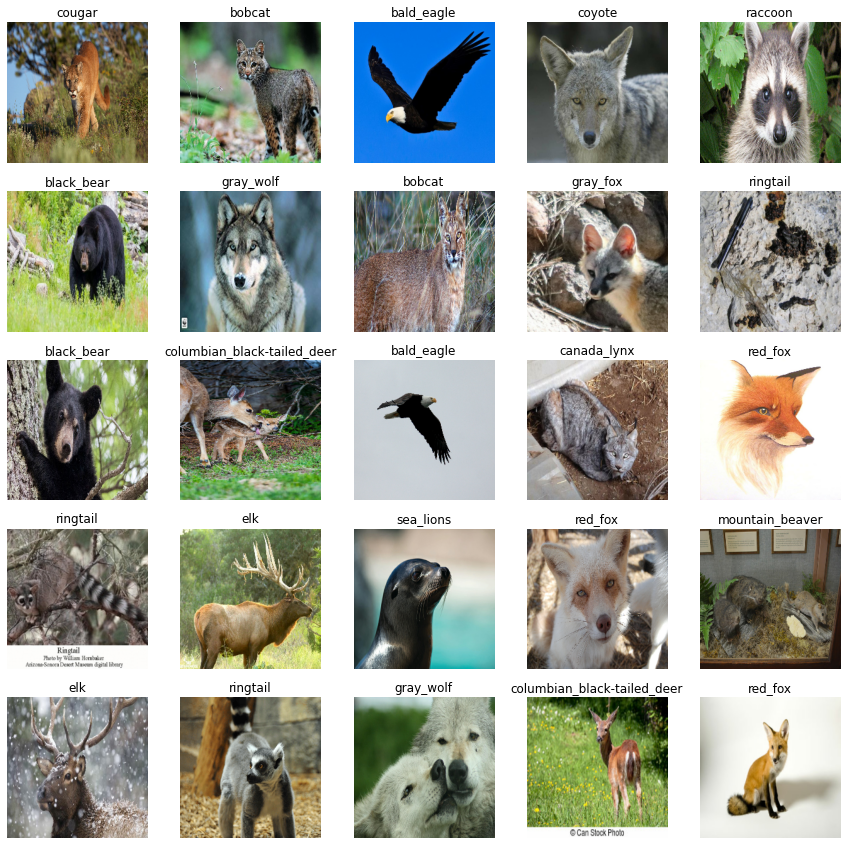

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 15))
for images, labels in train_ds.take(1):
  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    #plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

##Creating and training a model
Now our data is ready, let's prepare it modelling. We'll use an existing model from [TensorFlow Hub](https://tfhub.dev/).

###Building a model

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, img_height, img_width, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE =  len(class_names)# number of classes

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):

  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    #tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.losses.SparseCategoricalCrossentropy(from_logits=True),
      #tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model

The first layer we use is the model from TensorFlow Hub (`hub.KerasLayer`(MODEL_URL)). So our first layer is actually an entire model (many more layers). This input layer takes in our images and finds patterns in them based on the patterns `mobilenet_v2_130_224` has found.

In [ ]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 20)                20040     
Total params: 5,452,753
Trainable params: 20,040
Non-trainable params: 5,432,713
_________________________________________________________________


###Creating callbacks

We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

[TensorBoard](https://www.tensorflow.org/tensorboard/get_started) helps provide a visual way to monitor the progress of your model during and after training.

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/My Drive/projects/wildlife/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

[Early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. 

In [ ]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

###Training a model (on a subset of data)

In [ ]:
# Check again if GPU is available (otherwise computing will take a looooonnnnggggg time)
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


In [ ]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Since we're working with 14,000+ images, it's a good idea to work with a portion of them to make sure things are working before training on them all.

In [ ]:
train_ds_sub = train_ds.take(99)
val_ds_sub = val_ds.take(33)

train_ds_sub = train_ds_sub.cache().prefetch(buffer_size=AUTOTUNE)
val_ds_sub = val_ds_sub.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
print(tf.data.experimental.cardinality(train_ds_sub).numpy())
print(tf.data.experimental.cardinality(val_ds_sub).numpy())

99
33


In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_ds_sub,
            epochs=NUM_EPOCHS,
            validation_data=val_ds_sub,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/99 [..............................] - ETA: 0s - loss: 3.0180 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


99/99 [==============================] - 630s 6s/step - loss: 2.5690 - accuracy: 0.5600 - val_loss: 2.3953 - val_accuracy: 0.7131
Epoch 2/100
99/99 [==============================] - 6s 64ms/step - loss: 2.3117 - accuracy: 0.7955 - val_loss: 2.2788 - val_accuracy: 0.8239
Epoch 3/100
99/99 [==============================] - 6s 62ms/step - loss: 2.2199 - accuracy: 0.8854 - val_loss: 2.2533 - val_accuracy: 0.8494
Epoch 4/100
99/99 [==============================] - 6s 62ms/step - loss: 2.1912 - accuracy: 0.9097 - val_loss: 2.2447 - val_accuracy: 0.8523
Epoch 5/100
99/99 [==============================] - 6s 63ms/step - loss: 2.1760 - accuracy: 0.9220 - val_loss: 2.2386 - val_accuracy: 0.8598
Epoch 6/100
99/99 [==============================] - 6s 62ms/step - loss: 2.1647 - accuracy: 0.9296 - val_loss: 2.2348 - val_accuracy: 0.8627
Epoch 7/100
99/99 [==============================] - 6s 62ms/step - loss: 2.1566 - accuracy: 0.9359 - val_loss: 2.2314 - val_accuracy: 0.8665
Epoch 8/100
99/99 

###Visualize training results

In [ ]:
%tensorboard --logdir /content/drive/My\ Drive/projects/wildlife/logs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
model.metrics_names

['loss', 'accuracy']

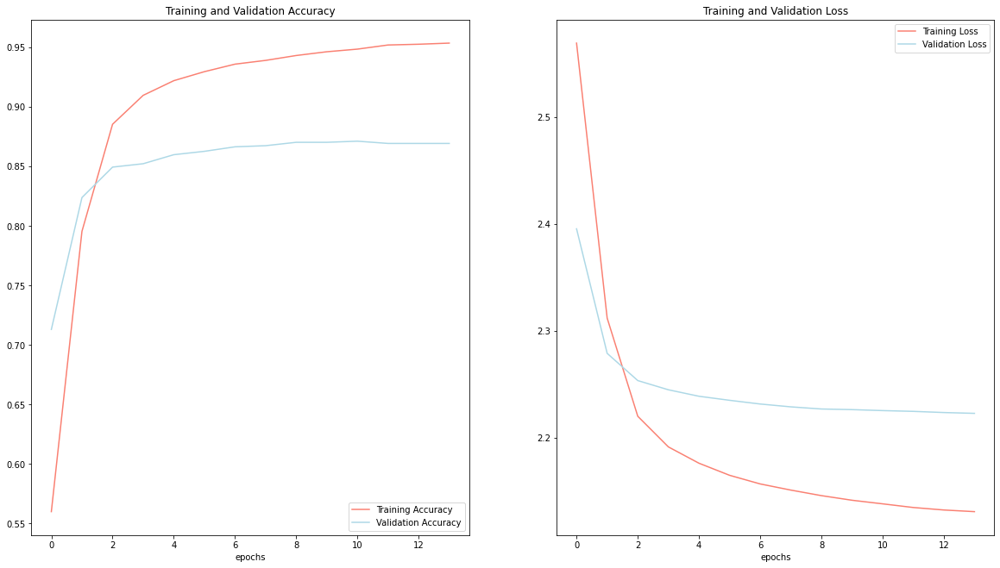

In [ ]:
acc = model.history.history['accuracy']
val_acc = model.history.history['val_accuracy']

loss = model.history.history['loss']
val_loss = model.history.history['val_loss']

epochs_range = range(14)

plt.figure(figsize=(20, 11))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy', color='salmon')
plt.plot(epochs_range, val_acc, label='Validation Accuracy', color='lightblue')
plt.legend(loc='lower right')
plt.xlabel('epochs')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss', color='salmon')
plt.plot(epochs_range, val_loss, label='Validation Loss', color='lightblue')
plt.legend(loc='upper right')
plt.xlabel('epochs')
plt.title('Training and Validation Loss')
plt.show()

##Making and evaluating predictions using a trained model

Making predictions with a trained model is as calling `predict()` on it and passing it data in the same format the model was trained on.

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_ds_sub, verbose=1) # verbose shows us how long there is to go
predictions

 2/33 [>.............................] - ETA: 0sWARNING:tensorflow:Callbacks method `on_predict_batch_end` is slow compared to the batch time (batch time: 0.0109s vs `on_predict_batch_end` time: 0.0499s). Check your callbacks.


33/33 [==============================] - 2s 46ms/step


array([[9.99972105e-01, 9.29448785e-09, 1.48958357e-09, ...,
        1.92336192e-05, 3.24347366e-06, 1.51594705e-07],
       [4.76137423e-08, 1.79737879e-06, 5.26664508e-07, ...,
        8.29765440e-07, 5.76883622e-07, 2.15234036e-06],
       [5.73891956e-09, 1.12898144e-08, 7.85166137e-08, ...,
        1.96380273e-10, 8.06771663e-12, 9.37745437e-09],
       ...,
       [3.26246985e-09, 3.69622111e-09, 6.43464504e-10, ...,
        7.21326776e-10, 1.13236084e-07, 9.99990225e-01],
       [3.93744193e-09, 5.80941695e-08, 1.74082260e-09, ...,
        4.18095922e-08, 1.68554800e-06, 1.02529633e-07],
       [4.02848510e-09, 1.81932336e-09, 4.63958386e-11, ...,
        3.61100538e-10, 1.17288714e-07, 9.99989033e-01]], dtype=float32)

In [ ]:
# Check the shape of predictions
predictions.shape

(1056, 20)

Let's see how to convert an array of probabilities into an actual label.

In [ ]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {class_names[np.argmax(predictions[0])]}") # the predicted label

[9.9997211e-01 9.2944878e-09 1.4895836e-09 1.8948555e-06 3.0767272e-10
 1.1066040e-08 1.9609891e-08 2.7076583e-09 7.5824282e-08 3.8134264e-08
 9.1659238e-08 2.8034048e-08 2.4248332e-06 2.6260648e-07 4.6848456e-08
 7.7464417e-09 3.4618270e-07 1.9233619e-05 3.2434737e-06 1.5159470e-07]
Max value (probability of prediction): 0.9999721050262451
Sum: 1.0
Max index: 0
Predicted label: bald_eagle


Let's build a little function to convert prediction probabilities into predicted labels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return class_names[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'bald_eagle'

Since our validation data is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using `unbatch()`) and then turn it into an iterator using `as_numpy_iterator()`.

Let's make a small function to do so.

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(class_names[(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_ds_sub)
val_images[0], val_labels[0]

(array([[[1.04508214e-01, 1.20194487e-01, 1.55488610e-01],
         [1.22916676e-01, 1.38602942e-01, 1.73897058e-01],
         [1.19467795e-01, 1.35154068e-01, 1.70448184e-01],
         ...,
         [5.25830276e-02, 8.00340101e-02, 1.19249701e-01],
         [7.22512677e-02, 8.79375413e-02, 1.31074801e-01],
         [8.50579888e-02, 1.00744270e-01, 1.39049590e-01]],
 
        [[9.54656899e-02, 1.11151963e-01, 1.46446094e-01],
         [1.15983903e-01, 1.31670177e-01, 1.66964293e-01],
         [1.10714294e-01, 1.26400575e-01, 1.61694691e-01],
         ...,
         [5.50833642e-02, 7.07696378e-02, 1.17233232e-01],
         [6.89249337e-02, 8.46112072e-02, 1.27748474e-01],
         [8.09616745e-02, 9.66479480e-02, 1.31942064e-01]],
 
        [[8.80952477e-02, 1.03781521e-01, 1.39075637e-01],
         [1.12062335e-01, 1.27748609e-01, 1.63042724e-01],
         [1.06499955e-01, 1.22186229e-01, 1.57480344e-01],
         ...,
         [5.11252359e-02, 6.64963871e-02, 1.14500597e-01],
        

This function will:

* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [ ]:
import matplotlib.pyplot as plt

def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  #plt.imshow(image/255)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)
  

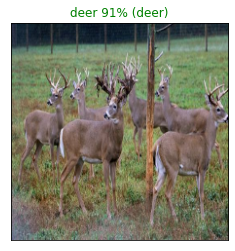

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

This function will:

* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using `get_pred_label()`.
* Find the top 7:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 7 prediction probability values and labels, coloring the true label green.


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 7 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 7 prediction confidence indexes
  top_7_pred_indexes = pred_prob.argsort()[-7:][::-1]
  # Find the top 7 prediction confidence values
  top_7_pred_values = pred_prob[top_7_pred_indexes]
  # Find the top 7 prediction labels
  top_7_pred_labels = class_names[top_7_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_7_pred_labels)), 
                     top_7_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_7_pred_labels)),
             labels=top_7_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_7_pred_labels):
    top_plot[np.argmax(top_7_pred_labels == true_label)].set_color("green")
  else:
    pass

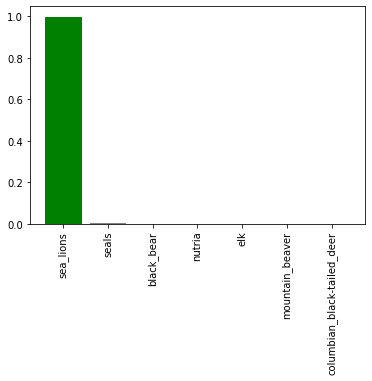

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

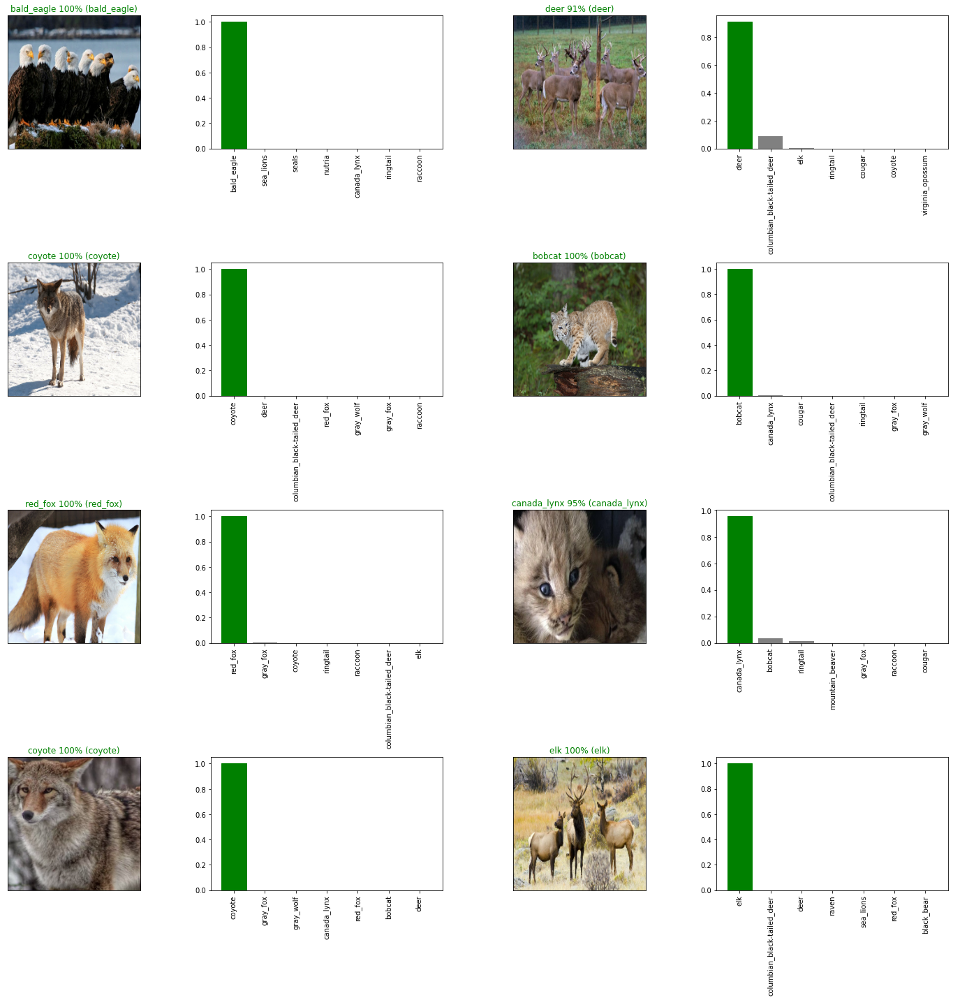

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 4
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

##🐻 Making predictions on custom images 🦝

It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

In [ ]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_image(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

In [ ]:
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE):
  """
  Creates batches of data out of image (x)
  """
  print("Creating test data batches...")
  data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
  data_batch = data.map(get_image).batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Get custom image filepaths
custom_path = '/content/drive/My Drive/projects/wildlife/custom_images/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/My Drive/projects/wildlife/custom_images/RedFox3-e1548112896442.jpg',
 '/content/drive/My Drive/projects/wildlife/custom_images/BaldEagle-FWS.jpg',
 '/content/drive/My Drive/projects/wildlife/custom_images/FVA4L2JYPZD5BNCO2IEIZCTUQI.jpg',
 '/content/drive/My Drive/projects/wildlife/custom_images/Raccoon-by-Krystal-Hamlin.jpg',
 '/content/drive/My Drive/projects/wildlife/custom_images/opossum_0043.jpg',
 '/content/drive/My Drive/projects/wildlife/custom_images/fd43c4f0-b89f-496f-9b71-b70c2e2863a2-large16x9_news140919700ar0qrmyvqjrrccz.jpg']

In [ ]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths)

Creating test data batches...


In [ ]:
# Make predictions on the custom data
custom_preds = model.predict(custom_data)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['red_fox', 'bald_eagle', 'cougar', 'raccoon', 'virginia_opossum', 'ringtail']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

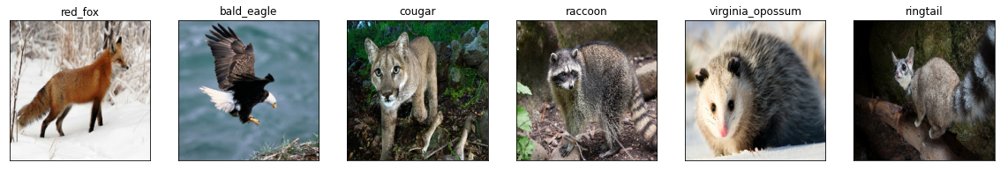

In [ ]:
# Check custom image predictions
plt.figure(figsize=(20, 20))
for i, image in enumerate(custom_images):
  plt.subplot(1, len(custom_pred_labels), i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)